This notebook/repo presents the results obtaned during the MP data technical test in which the goal is to:

- Implement the best possible model based on recall to predict NBA players chances of staying more than 5 years in the NBA via tabular historical data
- Implement and design a REST API to query this model via an URL request.

# Exploratory Data Analysis

We separate the preliminary data exploration in a few phases:

- Basic exploration
- Need for feature engineering exploration
- Missing data replacement / outliers
- What kind of task?

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import sklearn as sk
import numpy as np
import seaborn as sns   


df = pd.read_csv('data/nba_logreg.csv')

In [3]:
len(df)

1340

In [4]:
df.head()


,Name,GP,MIN,PTS,FGM,FGA,FG%,3P Made,3PA,3P%,...,FTA,FT%,OREB,DREB,REB,AST,STL,BLK,TOV,TARGET_5Yrs
0,Brandon Ingram,36,27.4,7.4,2.6,7.6,34.7,0.5,2.1,25.0,...,2.3,69.9,0.7,3.4,4.1,1.9,0.4,0.4,1.3,0.0
1,Andrew Harrison,35,26.9,7.2,2.0,6.7,29.6,0.7,2.8,23.5,...,3.4,76.5,0.5,2.0,2.4,3.7,1.1,0.5,1.6,0.0
2,JaKarr Sampson,74,15.3,5.2,2.0,4.7,42.2,0.4,1.7,24.4,...,1.3,67.0,0.5,1.7,2.2,1.0,0.5,0.3,1.0,0.0
3,Malik Sealy,58,11.6,5.7,2.3,5.5,42.6,0.1,0.5,22.6,...,1.3,68.9,1.0,0.9,1.9,0.8,0.6,0.1,1.0,1.0
4,Matt Geiger,48,11.5,4.5,1.6,3.0,52.4,0.0,0.1,0.0,...,1.9,67.4,1.0,1.5,2.5,0.3,0.3,0.4,0.8,1.0


In [23]:
df.iloc[0].transpose()

Name           Brandon Ingram
GP                         36
MIN                      27.4
PTS                       7.4
FGM                       2.6
FGA                       7.6
FG%                      34.7
3P Made                   0.5
3PA                       2.1
3P%                      25.0
FTM                       1.6
FTA                       2.3
FT%                      69.9
OREB                      0.7
DREB                      3.4
REB                       4.1
AST                       1.9
STL                       0.4
BLK                       0.4
TOV                       1.3
TARGET_5Yrs               0.0
Name: 0, dtype: object

In [5]:
df.columns

Index(['Name', 'GP', 'MIN', 'PTS', 'FGM', 'FGA', 'FG%', '3P Made', '3PA',
       '3P%', 'FTM', 'FTA', 'FT%', 'OREB', 'DREB', 'REB', 'AST', 'STL', 'BLK',
       'TOV', 'TARGET_5Yrs'],
      dtype='object')

## Formatting & Feature engineering

Looking at the values in the table above, all data is already properly formatted, and clean. It looks like some data might be redundant (e.g the % fields are just the relevant attempted field divided by the made field times 100. A good step towards this would be feature engineering)

A potential step to reducing the input size of the model would be to conduct PCA and determine which variables the dataset can be brought down to. However, this is usually done after a first round of fitting and model selection to have a baseline to compare to, which is why it does not fall within the scope of this technical test.

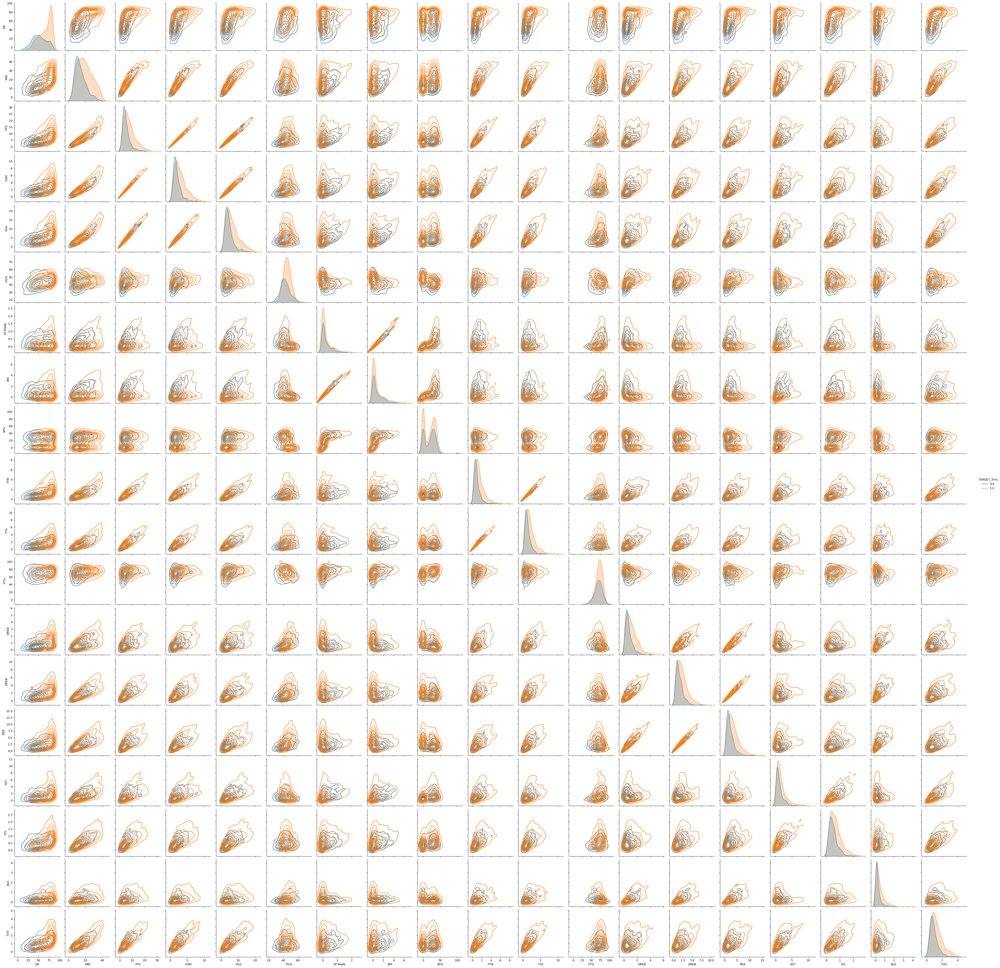

In [20]:
sns.pairplot(data=df,hue = "TARGET_5Yrs", kind="kde")

A quick glance shows that there doesn't seem to be many outliers. Orange is positive ground truth, meaning that for most metrics, players who make it past the 5 year mark have higher stats than other players, which is to be expected (except for 3P%, where the distribution seems mostly the same for both kinds of players, and centered around 2 peaks - makes sense if you know basketball : there are shooting specialists and non-shooting specialists)

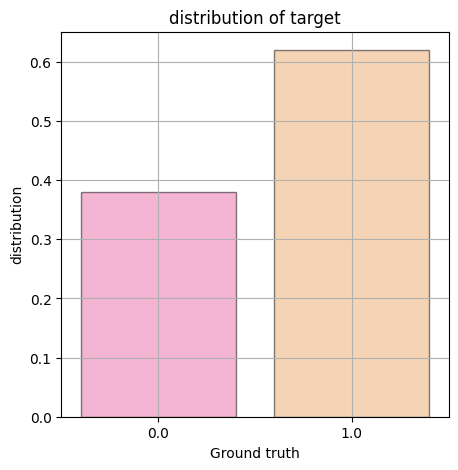

In [24]:
fig,ax = plt.subplots(figsize = (5,5))
sns.barplot(data = (df.TARGET_5Yrs.value_counts()/df.TARGET_5Yrs.value_counts().sum()).reset_index(), x = 'index', y = 'TARGET_5Yrs', palette= 'spring', edgecolor = 'k', linewidth = 1, alpha = .5)
plt.grid(True)
plt.title('distribution of target')
plt.xlabel('Ground truth')
plt.ylabel('distribution')
display()

## Data imbalance

The approximate balance is 40-60 in favor of players that stay in the league. This can not be considered an unreasonable imbalance and so we decide to not conduct oversampling/undersampling on the dataset to account for eventual class imbalance.

Note that data is binary and we are attempting to predict whether or not a player will stay. Our task is a *binary classification task*

## Missing values

In [18]:
df.isna().sum()

Name            0
GP              0
MIN             0
PTS             0
FGM             0
FGA             0
FG%             0
3P Made         0
3PA             0
3P%            11
FTM             0
FTA             0
FT%             0
OREB            0
DREB            0
REB             0
AST             0
STL             0
BLK             0
TOV             0
TARGET_5Yrs     0
dtype: int64

Only 11 missing values for one field, which is 3P%. This is only relevant when 3PA is 0, and so we decide to replace them with 0, which will be shown in the code walkthrough.

# Model Selection

In this section we will be walking through the code in test.py to explain the different steps as well as selecting the best model based on recall. Indeed, recall is a measure of among all the positive elements (i.e the players that stay in the league more than 5 years), how many are retrieved. It is a measure of how many relevant elements are spotted - a hit rate if you will.

On the other hand, Precision measure how many retrieved items are relevant. It is a measure of how often the model makes mistakes.

From a business standpoint, it makes more sense for stakeholders to not miss a promising recruit than to not want to hire a recruit that does not perform later on. It is much easier to fire a player than to get a very good player from another team or back into basketball. So, recall is our metric of choice for the model selection. Let's import our model fitter class first:

In [1]:
from src.test import NBAevaluator

In [2]:
evaluator = NBAevaluator()

## Loading and cleaning the dataset

the first step is to load and clean the dataset (i.e replace nan values with 0). Note that scaling the whole dataset is not good practice as it causes data leakage between the train and test set, so we do that later on. The code for this is shown here:

<code>
def load_and_clean(self):

        # Load dataset
        df = self.load()

        # extract names, labels, features names and values
        names = df['Name'].values.tolist()  # players names
        y = df['TARGET_5Yrs'].values  # labels
        paramset = df.drop(['TARGET_5Yrs', 'Name'], axis=1).columns.values
        X = df.drop(['TARGET_5Yrs', 'Name'], axis=1).values

        # replacing Nan values (only present when no 3 points attempts have been performed by a player)
        for x in np.argwhere(np.isnan(X)):
            X[x] = 0.0

        return names, X, y
</code>

In [3]:
names, X, y = evaluator.load_and_clean()

Next, split into train-test set. based on the size of the dataset, we estimate a 90-10 split is relevant for the task at hand:

<code>

def split_train_test(self, X, y):

        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=0.1, random_state=42)
        return X_train, X_test, y_train, y_test
</code>

In [4]:
evaluator.X_train, evaluator.X_test, evaluator.y_train, evaluator.y_test = evaluator.split_train_test(X, y)
        

We then scale the data in the TRAINING set ONLY and apply the scaler to the test set to obtain the scaled training and test sets without the data leakage associated with scaling them together:


<code>
    def scale_train_test(self, X_train, X_test):
    
        MMS = MinMaxScaler()
        X_train = MMS.fit_transform(X_train)
        self.scaler = MMS
        X_test = self.scaler.transform(X_test)
        return X_train, X_test



</code>

In [5]:
evaluator.X_train, evaluator.X_test = evaluator.scale_train_test(evaluator.X_train, evaluator.X_test)

Then, a list of classifiers is imported from config (classic binary classification task classifiers) :

- KNN
- LogReg
- XGBoost
- Random Forest
- Support Vector Machine (two kernels)

And we perform a gridsearch on these models on the training set with 10-fold cross-validation to determine the optimal model. We optimize the grid searches for accuracy - as optimizing them for recall led to overfitting-prone models always choosing to classify the player as a 1, but choose our best model based on recall. All the models are fitted for their respective gridsearch using 10-fold cross validation, and report the average performance of each model on the validation sets:

<code>
def score_classifier(self, dataset, classifier, classifier_name, labels, gridsearch=None):


        """
        performs 3 random trainings/tests to build a confusion matrix and prints results with precision and recall scores
        :param dataset: the dataset to work on
        :param classifier: the classifier to use
        :param labels: the labels used for training and validation
        :return:
        """
        if gridsearch is not None:
            # Here we optimize for accuracy for a reason : optimizing for recall yields
            # best classifiers of recall 1 which always classify as a 1 (of course)
            # overfitting on the 1 class. So, we optimize for accuracy and choose the
            # best classifier for recall later on
            gs = GridSearchCV(estimator=classifier,
                              param_grid=gridsearch, scoring="accuracy")
        else:
            gs = classifier

        kf = KFold(n_splits=10, random_state=50, shuffle=True)
        confusion_mat = np.zeros((2, 2))
        recall, precision, accuracy = 0, 0, 0
        for training_ids, test_ids in kf.split(dataset):
            training_set = dataset[training_ids]
            training_labels = labels[training_ids]
            val_set = dataset[test_ids]
            val_labels = labels[test_ids]

            gs.fit(training_set, training_labels)

            if gridsearch is not None:
                classifier = gs.best_estimator_
            else:
                classifier = gs

            predicted_labels = classifier.predict(val_set)
            confusion_mat += confusion_matrix(val_labels, predicted_labels)
            recall += recall_score(val_labels, predicted_labels)
            precision += precision_score(val_labels, predicted_labels)
            accuracy += accuracy_score(val_labels, predicted_labels)
        recall /= 10
        precision /= 10
        accuracy /= 10
        return {
            'confusion_matrix': confusion_mat,
            'recall': recall,
            'precision': precision,
            'accuracy': accuracy,
            'model': classifier}
</code>

*Note that ideally, the parameters such as the number of folds would be moved to a config file to hard-code nothing into the base code*

In [6]:
train_records = evaluator.fit_classifiers_(
            evaluator.X_train, evaluator.y_train, gs=True)
evaluator.train_records = train_records

fitting: KNNC
fitting: SVC
fitting: SVCGamma
fitting: RFC
fitting: MLPC


We then score each classifier on our set apart test set to determine the best classifier for recall, which we will save in the back-end folder of our API for inference. This is done in the following function:

<code>

def score_classifier_on_test_set(self, test_set, test_labels, classifier, classifier_name):

        predicted_labels = classifier.predict(test_set)
        confusion_mat = confusion_matrix(test_labels, predicted_labels)
        recall = recall_score(test_labels, predicted_labels)
        precision = precision_score(test_labels, predicted_labels)
        accuracy = accuracy_score(test_labels, predicted_labels)
        print(classifier_name + ':')
        print('confusion matrix: \n', confusion_mat)
        print(
            f'recall : {recall} - precision : {precision} - accuracy : {accuracy}')
        return {"confusion_matrix": confusion_mat,
                "precision": precision,
                "recall": recall,
                "accuracy": accuracy}

</code>

In [ ]:
test_records = {}
for record in train_records.keys():
    test_records[record] = evaluator.score_classifier_on_test_set(
        evaluator.X_test, evaluator.y_test, train_records[record]['model'], record)


Based on recall alone, we should be choosing XGBoost with 87.5% recall rate. However, XGBoost shows low accuracy and precision, which leads to interpretation of overfitting (always predicting 1). So, we choose the next best model which has good recall and a good precision-accuracy-recall balance : Logistic Regression. We can save it using the following function from the evaluator class:

<code>

    def select_save_best_model(self,model_name = "logreg"):
        print("performance of best selected model on test set: \n \n")
        self.score_classifier_on_test_set(self.X_test,self.y_test, self.train_records[model_name]['model'], model_name)
        pipeline = Pipeline([('scaler', self.scaler),('model',self.train_records[model_name]['model'])])
        joblib.dump(pipeline,f'nba_performance_prediction_back/pipelines/best_model.pkl')



</code>

This is all condensed into the <code> fitting_pipeline</code> method of the evaluator class:

<code>

  def fitting_pipeline(self, gs=False):
  
        print('loading and cleaning dataset')
        names, X, y = self.load_and_clean()
        # normalize dataset
        # NO SCALING ON ALL DATA => INFO LEAKAGE
        # X = MinMaxScaler().fit_transform(df_vals)

        print('splitting into test and train set')
        self.X_train, self.X_test, self.y_train, self.y_test = self.split_train_test(X, y)
        print("scaling train data and applying on test data")
        self.X_train, self.X_test = self.scale_train_test(self.X_train, self.X_test)
        print('fitting classifiers on train set')
        train_records = self.fit_classifiers_(
            self.X_train, self.y_train, gs=gs)
        self.train_records = train_records
        print('scoring best classifiers on test set')
        test_records = {}
        for record in train_records.keys():
            test_records[record] = self.score_classifier_on_test_set(
                self.X_test, self.y_test, train_records[record]['model'], record)
        
        return test_records

</code>

Which can be ran from the cli using:

<code> python src/main.py</code>

We can also ge the parameters of each optimal model to not have to conduct the grid search every time (gs = False).

In [ ]:
for record in evaluator.train_records.keys():
    model = evaluator.train_records[record]['model']
    evaluator.score_classifier_on_test_set(
                evaluator.X_test, evaluator.y_test, evaluator.train_records[record]['model'], record)
    print(model.get_params())

# API Design

Our goal is to design a rest API to take unitary calls for the model to process. To do this, we use django. All the source code can be found in the nba_performance_prediction_back folder. We Also created a webapp to showcase the results with react and linked it to the django Backend. To test the API, please install the required dependencies in requirement.txt in a virtualenv by running

<code>pip install virtualenv</code>

<code>virtualenv nba</code>

<code>source nba/bin/activate</code>

<code>pip install -r nba_performance_predition_back/requirements.txt</code>

 and run

<code>python manage.py runserver</code>


You can either test the API by sending a post request to http://localhost:8000/scoreJson with the following body;

{
    "GP": 10,
    "MIN": 5,
    "PTS": 10,
    "FGM": 5,
    "FGA": 2,
    "FG%": 65,
    "3PMade": 23,
    "3PA": 46,
    "3P%": 11,
    "FTM": 1,
    "FTA": 2,
    "FT%": 50,
    "OREB": 10,
    "DREB": 12,
    "REB": 15,
    "AST": 16,
    "STL": 12,
    "BLK": 4,
    "TOV": 1
}

Or you can run the Front-end web app to get the full experience. To do this, install npm and react and tailwind css and try it out by running

<code>npm install -g serve</code>

<code>serve -s build</code>

From within nba_performance_prediction

Unfortunately, I would have dockerized the whole app but did not have the time to do so.



### TODO

- prevent user from entering negative values for some stuff + impossible values (attemps > made)
- make app responsive
- automate training with clic
- feature engineering (PCA)